# *

In [383]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from copy import copy 

In [384]:
def show(*args, c=2) -> None: 
    l = len(args)
    r = max(round(l/c), 1)
    fig = plt.figure(figsize=(20, 15))
    for i, img in enumerate(args):
        pos = i+1
        fig.add_subplot(r, c, pos)
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img[:, :, ::-1])
        plt.axis("off")
    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    plt.show()

def normalize(img, alpha=0, beta=1):
    return cv2.normalize(img, None, alpha=alpha, beta=beta, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_64F)

def cvt_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Harris corners

## Write functions to compute both the X and Y gradients. Try your code on both transA and simA. 

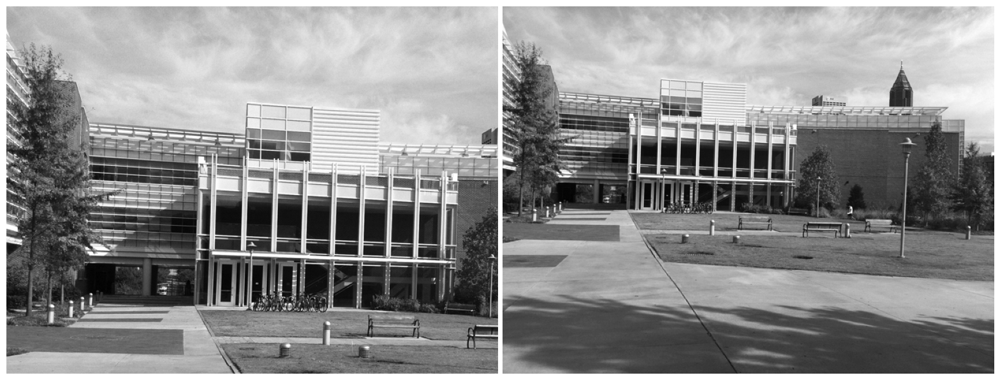

In [385]:
trans_a = cvt_gray(cv2.imread('./input/transA.jpg'))
trans_b = cvt_gray(cv2.imread('./input/transB.jpg'))
sim_a = cvt_gray(cv2.imread('./input/simA.jpg'))
sim_b = cvt_gray(cv2.imread('./input/simB.jpg'))
show(trans_a, sim_a)


In [386]:
def gradients(img, k_size=3, sigma=0):
    x_g = np.asarray([[3, 0, -3],[1, 0, -1],[3, 0, -3]])
    k = cv2.getGaussianKernel(k_size, sigma)
    gaussian_kernel = k @ k.T
    gaussian_y_gradient = cv2.filter2D(gaussian_kernel, ddepth=-1, kernel=x_g, borderType=cv2.BORDER_REFLECT)
    gaussian_x_gradient = gaussian_y_gradient.T

    img_x_gradient = cv2.filter2D(img.astype(np.float64), ddepth=-1, kernel=gaussian_x_gradient, borderType=cv2.BORDER_REFLECT)
    img_y_gradient = cv2.filter2D(img.astype(np.float64), ddepth=-1, kernel=gaussian_y_gradient, borderType=cv2.BORDER_REFLECT)

    return img_x_gradient, img_y_gradient


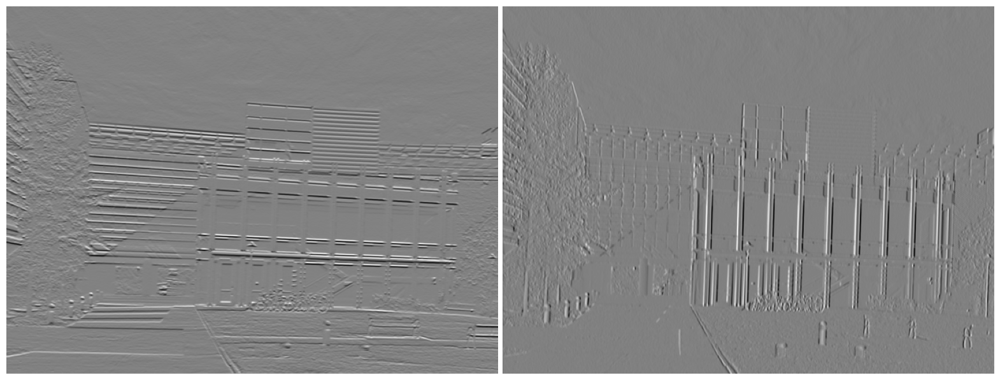

In [387]:
trans_x_grad, trans_y_gradient = gradients(trans_a)
show(normalize(trans_x_grad), normalize(trans_y_gradient))

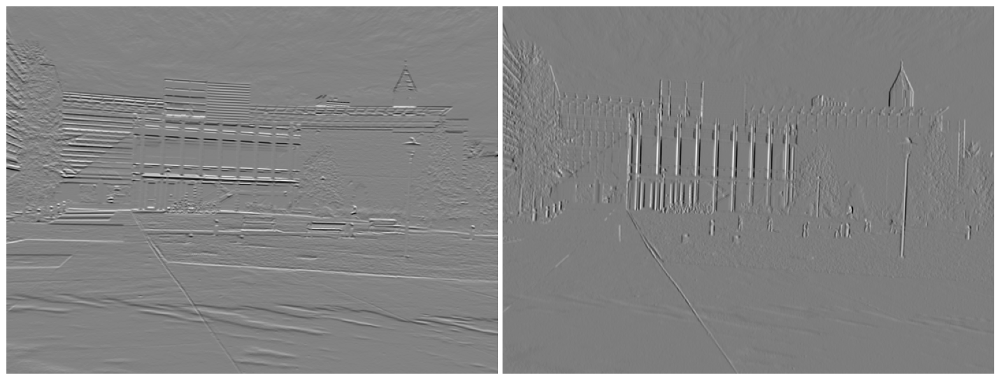

In [388]:
sim_x_grad, sim_y_gradient = gradients(sim_a)
show(normalize(sim_x_grad), normalize(sim_y_gradient))

## Now you can compute the Harris value for the image. 

In [389]:
def harris_values(img, window_size=3, alpha=0.03):
    Ix, Iy = gradients(img)
    Ix = normalize(Ix, -1, 1)
    Iy = normalize(Iy, -1, 1)
    Ixx = Ix*Ix
    Ixy = Ix*Iy
    Iyy = Iy*Iy
    k = cv2.getGaussianKernel(window_size, 0)
    window = k @ k.T
    ctr = int(window_size/2)
    h, w = img.shape
    H_values = np.zeros((h, w), dtype=np.float32)
    for y in range(ctr, h-ctr):
        for x in range(ctr, w-ctr):
            wIxx = np.sum(window * Ixx[y-ctr:y+ctr+1, x-ctr:x+ctr+1])
            wIyy = np.sum(window * Iyy[y-ctr:y+ctr+1, x-ctr:x+ctr+1])
            wIxy = np.sum(window * Ixy[y-ctr:y+ctr+1, x-ctr:x+ctr+1])
            M = np.array([[wIxx, wIxy],[wIxy, wIyy]])
            R = np.linalg.det(M) - alpha*(np.trace(M)**2)
            H_values[y, x] = R
    return H_values

In [390]:
H_trans_a = harris_values(trans_a)
H_trans_b = harris_values(trans_b)
H_sim_a = harris_values(sim_a)
H_sim_b = harris_values(sim_b)

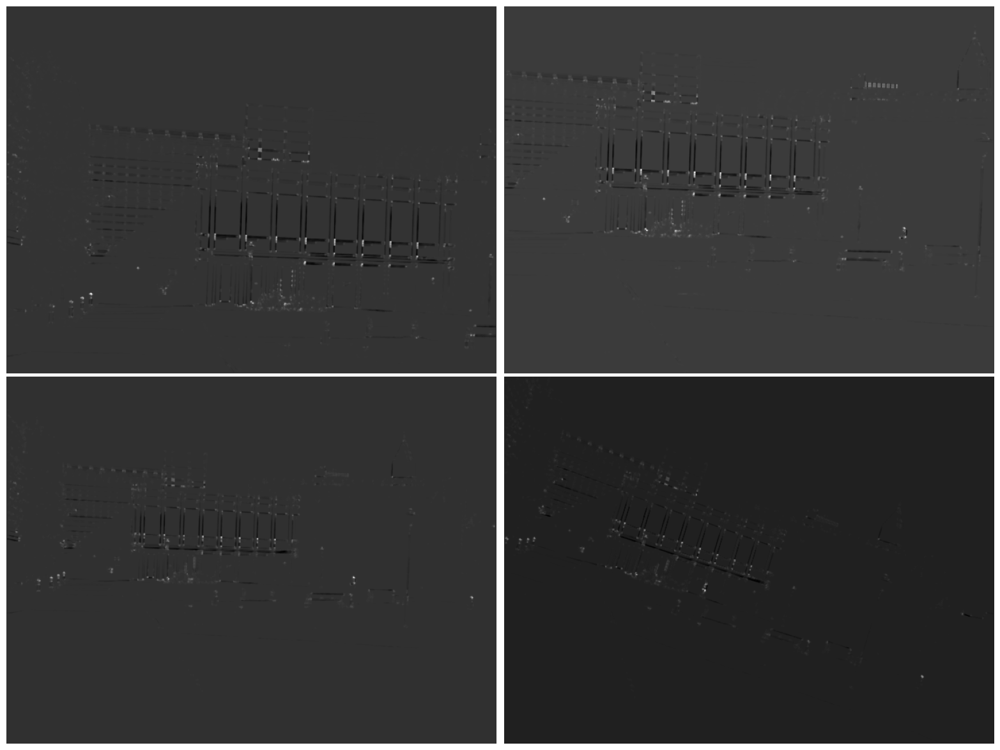

In [391]:
show(normalize(H_trans_a), normalize(H_trans_b), normalize(H_sim_a), normalize(H_sim_b))

## Finally you can find some corner points. To do this requires two steps: thresholding and non- maximal suppression. 

In [392]:
def corners(H_values, thresh=None, wsize=5):
    h, w = H_values.shape
    H_values = normalize(H_values)
    if thresh is None:
        thresh = np.mean(H_values) + 0.02
    ctr = int(wsize/2)
    for y in range(ctr, h-ctr):
        for x in range(ctr, w-ctr):
            window = H_values[y-ctr:y+ctr+1, x-ctr:x+ctr+1]
            max_value = np.max(window)
            supressed = np.zeros((wsize, )*2)
            if max_value > thresh:
                supressed[np.unravel_index(window.argmax(), window.shape)] = 1
            H_values[y-ctr:y+ctr+1, x-ctr:x+ctr+1] = supressed
    return np.argwhere(H_values>0)

In [393]:
c_t_a = corners(H_trans_a)
c_t_b = corners(H_trans_b)
c_s_a = corners(H_sim_a)
c_s_b = corners(H_sim_b)

In [394]:
len(c_t_a), len(c_t_b), len(c_s_a), len(c_s_b),

(693, 610, 404, 420)

In [395]:
trans_a = cv2.imread('./input/transA.jpg')
trans_b = cv2.imread('./input/transB.jpg')
sim_a = cv2.imread('./input/simA.jpg')
sim_b = cv2.imread('./input/simB.jpg')

In [396]:
def plot_corners(img, crs):
    for c in crs:
        cv2.circle(img, c[::-1], 1, (0,0,255), 1)


In [397]:
plot_corners(trans_a, c_t_a)
plot_corners(trans_b, c_t_b)
plot_corners(sim_a, c_s_a)
plot_corners(sim_b, c_s_b)

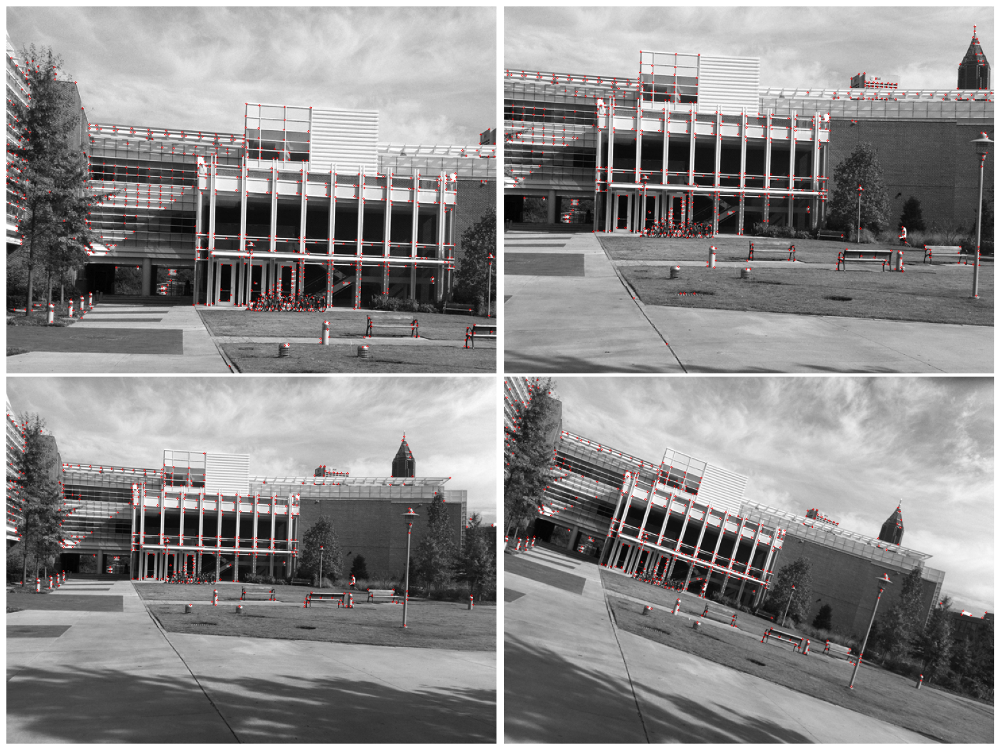

In [398]:
show(trans_a, trans_b, sim_a, sim_b)

# SIFT features

## Write the function to compute the angle. Then for the set of interest points you found above, plot the points for all of transA, transB, simA and simB on the respective images and draw a little line that shows the direction of the gradient. 

In [399]:
trans_a = cvt_gray(cv2.imread('./input/transA.jpg'))
trans_b = cvt_gray(cv2.imread('./input/transB.jpg'))
sim_a = cvt_gray(cv2.imread('./input/simA.jpg'))
sim_b = cvt_gray(cv2.imread('./input/simB.jpg'))

In [400]:
def key_points(img, crnrs):
    Ix, Iy = gradients(img)
    return [cv2.KeyPoint(x=float(el[1]),y=float(el[0]), size=10, angle = cv2.fastAtan2(Iy[el[0], el[1]], Ix[el[0], el[1]]), octave=0) for el in crnrs]    

In [401]:
points_t_a = key_points(trans_a, c_t_a)
points_t_b = key_points(trans_b, c_t_b)
points_s_a = key_points(sim_a, c_s_a)
points_s_b = key_points(sim_b, c_s_b)

trans_a_p = cv2.drawKeypoints(trans_a, points_t_a, 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
trans_b_p = cv2.drawKeypoints(trans_b, points_t_b, 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
sim_a_p = cv2.drawKeypoints(sim_a, points_s_a, 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
sim_b_p = cv2.drawKeypoints(sim_b, points_s_b, 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [402]:
points_t_b[1].pt, points_t_a[1].pt

((614.0, 32.0), (34.0, 71.0))

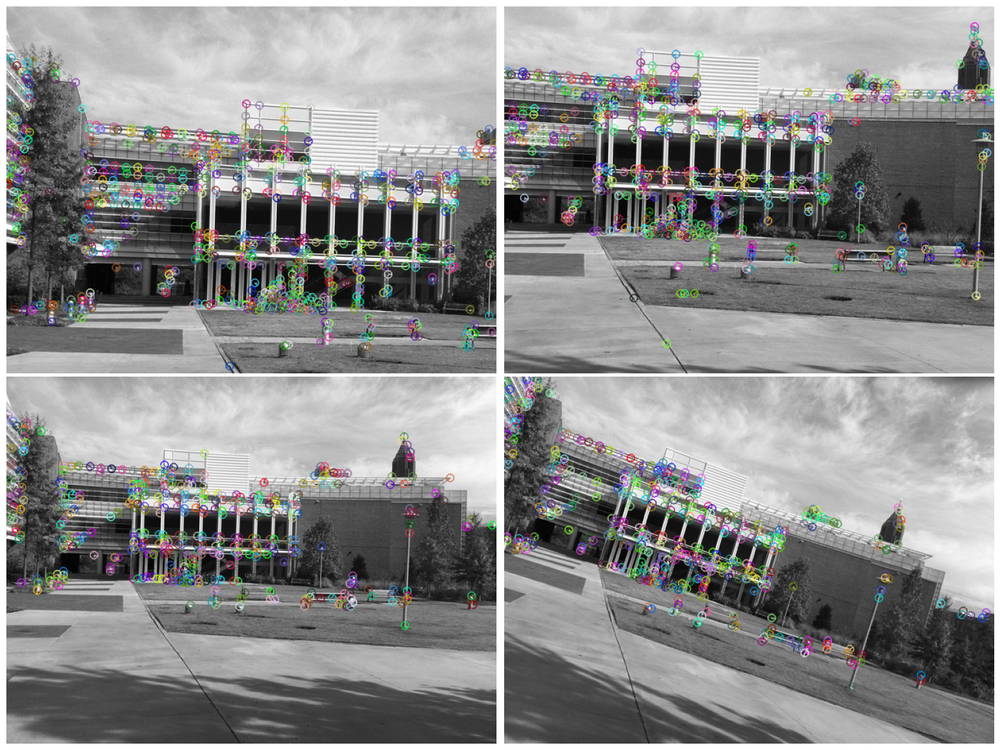

In [403]:
show(trans_a_p, trans_b_p, sim_a_p, sim_b_p)

## Now we’re going to call the SIFT descriptor code.

In [404]:
def descriptor(img, kp):
    sift = cv2.SIFT.create()
    _, d = sift.compute(img, kp)
    return d

## Once we have the descriptors, we need to match them. 

In [405]:
def match_descriptors(d_1, d_2):
    bf = cv2.BFMatcher()
    matches = bf.match(d_1,d_2)
    return sorted(matches, key=lambda x: x.distance)

## Now, both of the SIFT packages have functions to draw matches. ***But you are not permitted to use them!!!***

In [406]:
def combine_imgs(img1, img2):
    return np.concatenate((img1, img2), axis=1)

def draw_lines(img1, img2, matches):
    img_combined = combine_imgs(img1, img2)
    img_combined = cv2.cvtColor(img_combined, cv2.COLOR_GRAY2BGR)
    for match in matches:
        clr_l = (list(np.random.choice(range(256), size=3)))  
        color =[int(clr_l[0]), int(clr_l[1]), int(clr_l[2])]
        pt1 = copy(match[0])
        pt2 = copy(match[1])
        pt2[0] += img1.shape[1]
        cv2.circle(img_combined, pt1, 3, color, -1)
        cv2.circle(img_combined, pt2, 3, color, -1)
        cv2.line(img_combined, pt1, pt2, color)
    show(img_combined, c=1)

def putative_pair_points(img1, img2, kp_1, kp_2):
    d_1 = descriptor(img1, kp_1)
    d_2 = descriptor(img2, kp_2)

    matches = match_descriptors(d_1, d_2)

    return np.asarray([[kp_1[match.queryIdx].pt, kp_2[match.trainIdx].pt] for match in matches], dtype=int)


In [407]:
t_ab_matches = putative_pair_points(trans_a, trans_b, points_t_a, points_t_b)
s_ab_matches = putative_pair_points(sim_a, sim_b, points_s_a, points_s_b)


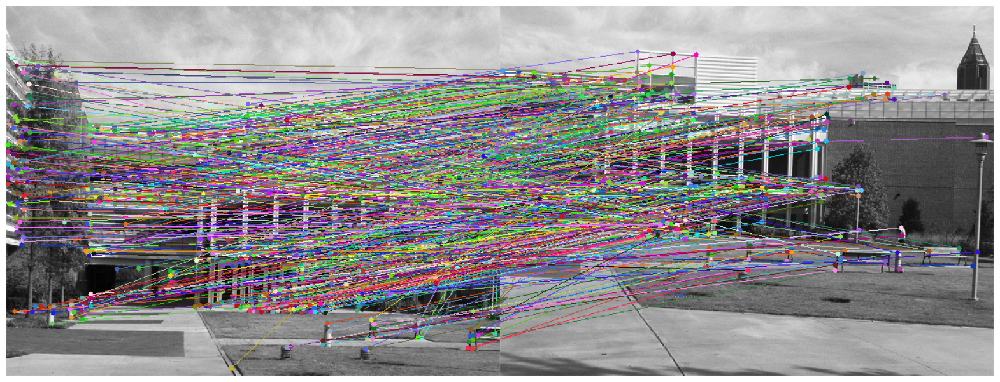

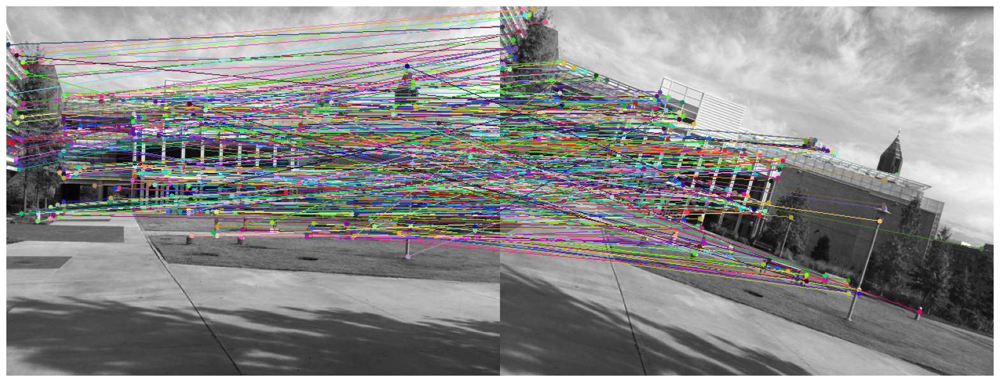

In [408]:
draw_lines(trans_a, trans_b, t_ab_matches)
draw_lines(sim_a, sim_b, s_ab_matches)

# RANSAC

## Write the code to do the translational case on transA and transB.

In [409]:
def compute_N(e, s, p=0.99):
    return np.log(1-p)/np.log(1-(1-e)**s)

In [410]:
def ransac_trans(matches):
    s = 1
    N = np.Inf
    sample_count = 0
    e = 1.0
    valid_idxs = np.arange(0, len(matches))
    used_idxs = []
    consensus_set = []
    while N > sample_count:
        matches_set = []
        idx = np.random.choice(valid_idxs)
        match = matches[idx]
        T_MATRIX = match[1] - match[0]
        for i in valid_idxs:
            if i == idx:
                continue
            match = matches[i]
            d = match[1] - match[0]
            if np.isclose(T_MATRIX, d, atol=4).all():
                used_idxs.append(i)
                matches_set.append(matches[i])
        if len(matches_set) > 0:
            used_idxs.append(idx)
            consensus_set.append((matches_set, T_MATRIX))
            e0 = 1 - (len(matches_set)/len(matches))
            if e0 < e:
                e = e0
                N = compute_N(e, s)
        valid_idxs = [idx for idx in valid_idxs if idx not in used_idxs]
        sample_count += 1
    return sorted(consensus_set, key=lambda x: len(x[0]), reverse=True)[0]

In [411]:
best_m, matrix_trans = ransac_trans(t_ab_matches)

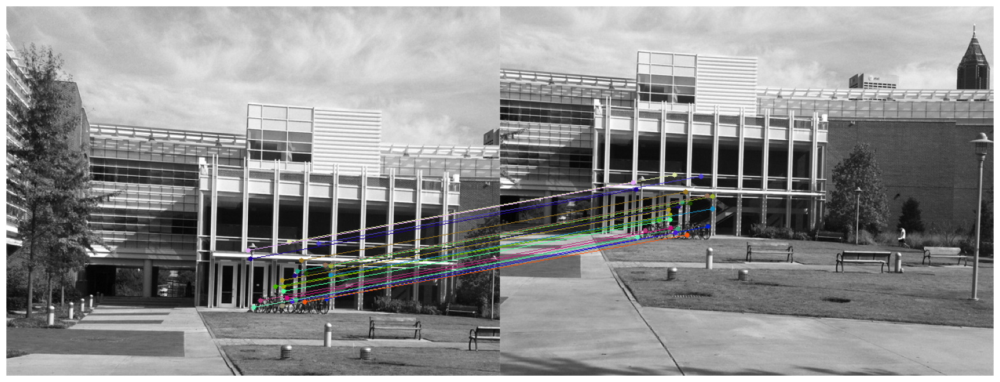

In [412]:
draw_lines(trans_a, trans_b, best_m)

## For the other image pair we need to compute a similarity transform

In [442]:
def compute_similarity(match1, match2):
    coeff_m = np.asarray([  [match1[0][0], match1[0][1], 1, 0],
                            [match1[0][1], -match1[0][0], 0, 1],
                            [match2[0][0], match2[0][1], 1, 0],
                            [match2[0][1], -match2[0][0], 0, 1]])
    tr = np.array([match1[1][0], match1[1][1], match2[1][0], match2[1][1]])
    T, _, _, _ = np.linalg.lstsq(coeff_m, tr, rcond=None)
    return np.asarray([[T[0], T[1], T[2]],
                        [-T[1], T[0], T[3]]])
    

def ransac_sim(matches):
    s = 2
    N = np.Inf
    sample_count = 0
    e = 1.0
    valid_idxs = np.arange(0, len(matches))
    used_idxs = []
    consensus_set = []
    while N > sample_count:
        matches_set = []
        idx1, idx2 = np.random.choice(valid_idxs, s)
        match1 = matches[idx1]
        match2 = matches[idx2]
        T_MATRIX = compute_similarity(match1, match2)
        for i in valid_idxs:
            if i == idx1 or i == idx2:
                continue
            match = matches[i]
            res = T_MATRIX @ np.r_[match[0], [1]].T
            if np.isclose(match[1], res, atol=5).all():
                used_idxs.append(i)
                matches_set.append(matches[i])
        if len(matches_set) > 0:
            used_idxs.extend([idx1, idx2])
            consensus_set.append((matches_set, T_MATRIX))
            e0 = 1 - (len(matches_set)/len(matches))
            if e0 < e:
                e = e0
                N = compute_N(e, s)
        valid_idxs = [idx for idx in valid_idxs if idx not in used_idxs]
        sample_count += 1
    return sorted(consensus_set, key=lambda x: len(x[0]), reverse=True)[0]

In [443]:
best_m, matrix_sim = ransac_sim(s_ab_matches)

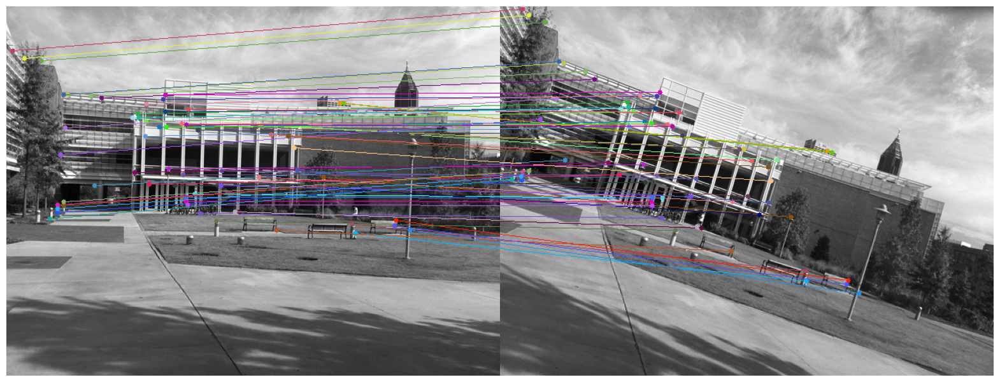

In [444]:
draw_lines(sim_a, sim_b, best_m)

## Try estimating the affine transform between simA and simB.

In [454]:
def compute_affine(matches):
    matches = np.concatenate(matches, axis=0)
    src = matches[0::2]
    dst = matches[1::2]
    return cv2.getAffineTransform(np.asarray(src, dtype=np.float32), np.asarray(dst, dtype=np.float32))
    

def ransac_affine(matches):
    s = 3
    N = np.Inf
    sample_count = 0
    e = 1.0
    valid_idxs = np.arange(0, len(matches))
    used_idxs = []
    consensus_set = []
    while N > sample_count:
        matches_set = []
        idxs = np.random.choice(valid_idxs, s)
        matches_sample = matches[idxs]
        T_MATRIX = compute_affine(matches_sample)
        for i in valid_idxs:
            if i in idxs:
                continue
            match = matches[i]
            res = T_MATRIX @ np.r_[match[0], [1]].T
            if np.isclose(match[1], res, atol=10).all():
                used_idxs.append(i)
                matches_set.append(matches[i])
        if len(matches_set) > 0:
            used_idxs.extend(idxs)
            consensus_set.append((matches_set, T_MATRIX))
            e0 = 1 - (len(matches_set)/len(matches))
            if e0 < e:
                e = e0
                N = compute_N(e, s)
        valid_idxs = [idx for idx in valid_idxs if idx not in used_idxs]
        sample_count += 1
    return sorted(consensus_set, key=lambda x: len(x[0]), reverse=True)[0]

In [455]:
best_m, matrix_affine = ransac_affine(s_ab_matches)

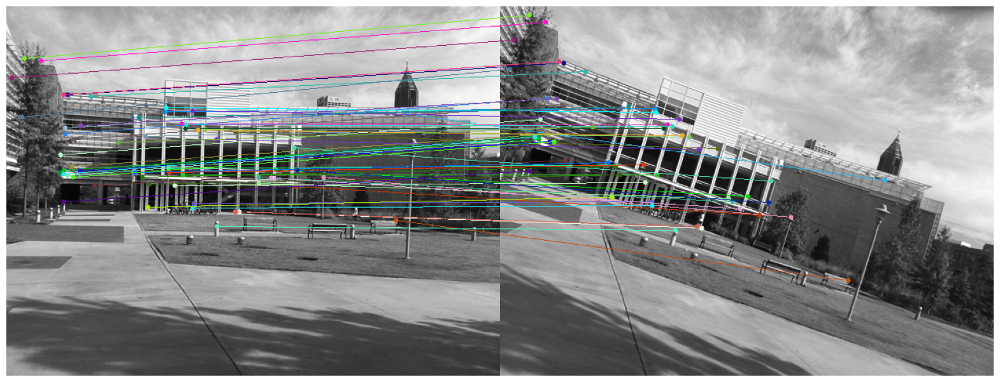

In [456]:
draw_lines(sim_a, sim_b, best_m)

## Finally, given these transforms, you should be able to warp the second image to the first. 

In [457]:
def warp(img1, img2, matrix):
    warped = cv2.warpAffine(img2, matrix, img2.shape[::-1], flags=cv2.WARP_INVERSE_MAP)
    warped = warped * 0.5
    warped[:img1.shape[0], :img1.shape[1]] += img1 * 0.5
    blend = cv2.normalize(warped, warped, alpha=0, beta=255,norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return blend

In [458]:
blend_s_a = warp(sim_a, sim_b, matrix_affine)
blend_s_s = warp(sim_a, sim_b, matrix_sim)

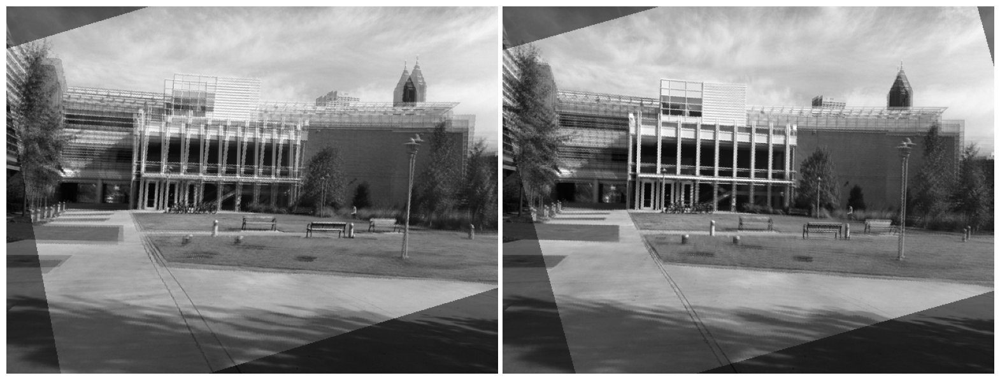

In [459]:
show(blend_s_a, blend_s_s)